#Top

In [1]:
import tensorflow as tf
# current processing

tf.config.set_visible_devices(tf.config.list_physical_devices('CPU'))


# gpus = tf.config.list_physical_devices('GPU')
# if gpus:
#     try:
#         # Currently, memory growth needs to be the same across GPUs
#         for gpu in gpus:
#             tf.config.experimental.set_memory_growth(gpu, True)
#             logical_gpus = tf.config.list_logical_devices('GPU')
#             print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
#     except RuntimeError as e:
#     # Memory growth must be set before GPUs have been initialized
#         print(e)

from importlib import import_module
import keras
from keras.api._v2 import keras as KerasAPI
keras: KerasAPI = import_module("tensorflow.keras")
print(tf.__version__)

from keras import Model, layers
from keras.models import Sequential
from keras.utils import plot_model
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, InputLayer, GlobalAveragePooling2D
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools
from sklearn.metrics import accuracy_score

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import Counter

from PIL import Image, ImageChops, ImageEnhance
import itertools
import os
import random

import time
import itertools
import shutil
import cv2
import zipfile

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
%matplotlib inline

2.10.0


In [2]:
path = ''
# from google.colab import drive
# drive.mount('/content/drive')
# path = '/content/drive/MyDrive/deepLearningAs3/'

# dataset = 'CASIA2'
dataset = 'CASIA1'
pathfinal = path + f'model_history/{dataset}/'
pathfinal2 = path + 'model_images/'

dir = f'{path + dataset}'
interval = 1
epoch = 100
batch_size_val = 32

casio2_data =  path+'CASIA2_processed_data'
casio1_data =  path+'CASIA1_processed_data'

global_random_state = 42
IMG_SIZE = (224, 224, 3)
np.random.seed(global_random_state)
checkpoint_path = ''

In [3]:
def delete_folder_contents(path_erase):
    '''
    take path to erase all data present on it
    '''
    folder_name = path_erase
    # Get all files in the folder
    files = os.listdir(folder_name)

    # Loop through the files and delete them
    for file in files:
        file_path = os.path.join(folder_name, file)
        try:
            if os.path.isfile(file_path):
                os.unlink(file_path)
            if os.path.isdir(file_path):
                shutil.rmtree(file_path)
        except Exception as e:
            print(f"Error deleting {file_path}: {e}")
            
delete_folder_contents(pathfinal)
delete_folder_contents(pathfinal2)

In [4]:
def convert_to_ELA_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'
    
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)
    
    ela_image = ImageChops.difference(image, temp_image)
    
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff

    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    # Remove the temporary compressed image
    image.close()
    temp_image.close()
    
    return ela_image

def prepare_image(image_path):
    return np.array(convert_to_ELA_image(image_path, 90).resize((IMG_SIZE[0], IMG_SIZE[1]))) / 255.0

Open a real image

CASIA1/Au/Au_ani_0044.jpg


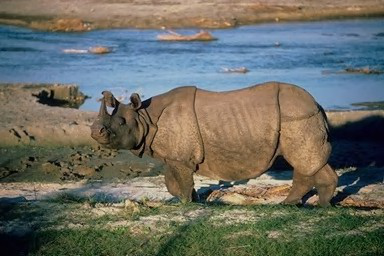

In [5]:
real_image_path = f'{dir}/Au/{os.listdir(f"{dir}/Au/")[14]}'
print(real_image_path)
Image.open(real_image_path)

After converting to ELA image

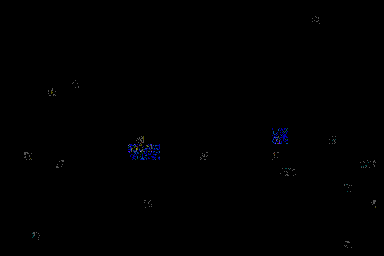

In [6]:
convert_to_ELA_image(real_image_path, 90)

Open a fake image

CASIA1/Tp/Sp_D_NND_A_nat0031_nat0096_0610.jpg


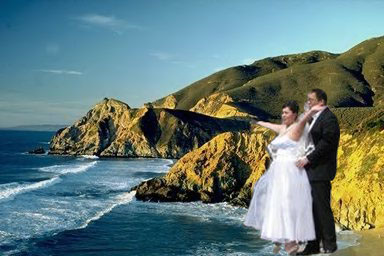

In [7]:
# fake_image_path = f'{dir}/Tp/{os.listdir(f"{dir}/Tp/")[30]}'
fake_image_path = f'{dir}/Tp/{os.listdir(f"{dir}/Tp/")[24]}'
print(fake_image_path)
Image.open(fake_image_path)

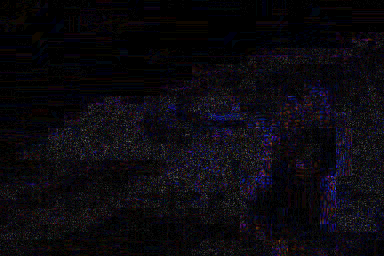

In [8]:
convert_to_ELA_image(fake_image_path, 90)

Dataset Preparation

In [9]:
%%script echo "skipped"

X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

path = f'{dir}/Au/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('tif'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append([1, 1])
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

path = f'{dir}/Tp/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('tif'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            
            if(filename[3] == 'D'):
                Y.append([0, 1]) # 1 for different
            else: # S
                Y.append([0, 0]) # 0 for same
            
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

X = np.array(X)

# Train Test split with 80:20 ratio
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=global_random_state)
print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))

skipped


In [10]:
# %%script echo "skipped"

# np.save(casio2_data + '/X_train', X_train)
# np.save(casio2_data + '/X_val', X_val)
# np.save(casio2_data + '/Y_train', Y_train)
# np.save(casio2_data + '/Y_val', Y_val)

# X_train = np.load(casio2_data + '/X_train.npy')
# X_val = np.load(casio2_data + '/X_val.npy')
# Y_train_t = np.load(casio2_data + '/Y_train.npy')
# Y_val_t = np.load(casio2_data + '/Y_val.npy')

# Y_train = Y_train_t[:, 0]
# Y_val = Y_val_t[:, 0]

In [11]:
# %%script echo "skipped"

# np.save(casio1_data + '/X_train', X_train)
# np.save(casio1_data + '/X_val', X_val)
# np.save(casio1_data + '/Y_train', Y_train)
# np.save(casio1_data + '/Y_val', Y_val)

X_train = np.load(casio1_data + '/X_train.npy')
X_val = np.load(casio1_data + '/X_val.npy')
Y_train_t = np.load(casio1_data + '/Y_train.npy')
Y_val_t = np.load(casio1_data + '/Y_val.npy')

Y_train = Y_train_t[:, 0]
Y_val = Y_val_t[:, 0]

print(X_train.shape, X_val.shape)

(1368, 224, 224, 3) (343, 224, 224, 3)


### Inference functions

In [12]:
def inferences(df_model_history, model):
    # print('\n\n')
    # print(f'Training Accuracy for model: {df_model_history["accuracy"].to_list()[-1]*100:.2f}%')
    # print(f'Validation Accuracy for model: {df_model_history["val_accuracy"].to_list()[-1]*100:.2f}%')
    # print(f'Test Accuracy for model: {model.evaluate(test_data, verbose=0)[1]*100:.2f}%')i

    df_model_history.plot(title="Accuracy / Loss vs Epoch", xlabel='Epoch', ylabel='Accuracy / Loss')
    plt.show()

    # Plot the loss and accuracy curves for training and validation 
    fig, ax = plt.subplots(2,1)
    ax[0].plot(df_model_history['loss'], color='b', label="Training loss")
    ax[0].plot(df_model_history['val_loss'], color='r', label="validation loss")
    legend = ax[0].legend(loc='best', shadow=True)

    ax[1].plot(df_model_history['accuracy'], color='b', label="Training accuracy")
    ax[1].plot(df_model_history['val_accuracy'], color='r',label="Validation accuracy")
    legend = ax[1].legend(loc='best', shadow=True)
    plt.show()

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
    


### Callbacks


In [13]:
class ModelSaving(keras.callbacks.Callback):
    def __init__(self, interval=1e9):
        self.currentEpoch = 0
        self.interval = interval
        
    def on_epoch_end(self, epoch, logs=None):
        self.currentEpoch = epoch
        if(self.currentEpoch%self.interval == 0):
            self.model.save(f'{pathfinal}{self.model.name}_{self.currentEpoch+1}.tf')

    def on_train_end(self, logs=None):
        self.model.save(f'{pathfinal}{self.model.name}_{self.currentEpoch+1}.tf')
        # print("Training has ended!, model saved")

    
class HistorySaver(keras.callbacks.Callback):
    def __init__(self, initial_history, interval=1e9):
        super(HistorySaver, self).__init__()
        self.history = {}
        self.currentEpoch = 0
        self.interval = interval
        for key, value in [('loss', initial_history[0]), ('accuracy', initial_history[1]), ('val_loss', initial_history[2]), ('val_accuracy', initial_history[3])]:
            self.history.setdefault(key, []).append(value)
        
        # logs.items() = dict_items([('loss', 1.3612865209579468), ('accuracy', 0.46034255623817444), ('val_loss', 1.1157031059265137), ('val_accuracy', 0.6484848856925964)])
    def on_epoch_end(self, epoch, logs=None):
        for key, value in logs.items():
            self.history.setdefault(key, []).append(value)
        self.currentEpoch = epoch

        if(self.currentEpoch%self.interval == 0):
            pd.DataFrame(self.history).to_csv(f'{pathfinal}{self.model.name}_{self.currentEpoch+1}.csv', index=False)

        
    def on_train_end(self, logs=None):
        pd.DataFrame(self.history).to_csv(f'{pathfinal}{self.model.name}_{self.currentEpoch+1}.csv', index=False)
        # print("Training has ended!, model history saved")



# create the callbacks

model_saver = ModelSaving(interval)

# This means if for 15 epochs the accuracy has no progress on 
# the validation set then it would stop and store the previous best value.
early_stopping_cb = keras.callbacks.EarlyStopping(monitor='val_loss',
                                                  patience=15,
                                                  min_delta=1e-4,
                                                  mode='min',
                                                  restore_best_weights=False, 
                                                  verbose=1)

checkpoint_callback = keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True, # save only the model weights
                                                         save_freq="epoch") # save the model weights which score the best validation accuracy) 

### Activation and Gradient functions

In [14]:
@tf.custom_gradient
def GbpRelu(x):
  def grad(dy):
    return tf.cast(dy>0,"float32") * tf.cast(x>0, "float32") * dy
  return tf.nn.relu(x), grad

@tf.custom_gradient
def DeconvnetRelu(x):
  def grad(dy):
    return tf.cast(dy>0,"float32") * dy
  return x, grad

@tf.custom_gradient
def ReluOrig(x):
  def grad(dy):
    return tf.cast(x>0, "float32") * dy
  return tf.nn.relu(x), grad

@tf.custom_gradient
def lineraOrg(x):
  def grad(dy):
    return dy
  return x, grad


def deprocess_image(grads):
    """Same normalization as in:
    https://github.com/fchollet/keras/blob/master/examples/conv_filter_visualization.py
    """

    grads = np.array(grads)

    # normalize tensor: center on 0., ensure std is 0.25
    grads = grads.copy()
    grads -= grads.mean()
    grads /= (grads.std() + 1e-07)
    grads *= 0.25

    # clip to [0, 1]
    grads += 0.5
    grads = np.clip(grads, 0, 1)

    # convert to RGB array
    grads *= 255

    grads = np.clip(grads, 0, 255).astype('uint8')

    grads = np.flip(grads,-1)
    return grads


def get_intermediate_gradients(model, image, x, y, z):
    # inputs = tf.cast(tf.expand_dims(image/255., axis=0), dtype=tf.float32)
    inputs = tf.cast(tf.expand_dims(image, axis=0), dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(inputs)
        intermediate_output = model.intermediate_output(inputs)
        if(x==':' and y==':' and z==':'):
          neuron = intermediate_output
        else:
          neuron = intermediate_output[:, x, y, z]

    grads_intermediate = tape.gradient(neuron, inputs)
    return grads_intermediate[0]


def activation_function_change(model, isGuidedRelu, activationFunction = None):
    if(isGuidedRelu==True and activationFunction==None):
        raise KeyError("Please provide activation function")
    n = len(model.layers)
    for i in range(n):
        layer = model.layers[i]
        if hasattr(layer, 'activation'):
            if(isGuidedRelu == True):
                if i==n-1:
                    # layer.activation = tf.keras.activations.linear
                    pass
                else:
                    layer.activation = activationFunction
            else:
                if i==n-1:
                    layer.activation = tf.keras.activations.softmax
                else:
                    layer.activation = tf.keras.activations.relu

def checkActivationFunction(model):
    for layer in model.layers:
        if hasattr(layer,'activation'):
            print(layer.name, layer.activation)


### CNN Model

In [15]:
class CNN(Model):
    def __init__(self, m_name='model'):
        super(CNN, self).__init__(name=m_name)
        self.m_name = m_name
        self.layers_list = []
        # Stage 1: Preprocessing (Resize image)
        # You can add a preprocessing layer to resize the input image to the desired size
        self.layers_list.append(InputLayer(input_shape=IMG_SIZE))  # Adjust the input shape as needed

        # Stage 2: Feature Extraction
        # First Convolutional Layer
        self.layers_list.append(Conv2D(16, (3, 3), activation='relu'))
        self.layers_list.append(MaxPooling2D((2, 2)))

        # Second Convolutional Layer
        self.layers_list.append(Conv2D(32, (3, 3), activation='relu'))
        self.layers_list.append(MaxPooling2D((2, 2)))

        # Third Convolutional Layer
        self.layers_list.append(Conv2D(64, (3, 3), activation='relu'))
        self.layers_list.append(MaxPooling2D((2, 2)))

        # Fourth Convolutional Layer
        self.layers_list.append(Conv2D(128, (3, 3), activation='relu', name='conv2d_last'))
        self.layers_list.append(MaxPooling2D((2, 2)))

        self.layers_list.append(GlobalAveragePooling2D())

        # Stage 3: Classification
        # Fully Connected Layer
        self.layers_list.append(Dense(64, activation='relu')) # added
        self.layers_list.append(Dense(2, activation='softmax')) # 2 classes (authentic or forgery)
    
    def intermediate_output(self, my_input):
        x = my_input
        for i in range(len(self.layers_list)):
            x = self.layers_list[i](x)
            if(self.layers_list[i].name == 'conv2d_last'):
                break
        return x
    
    def intermediate_conv_and_final_output(self, my_input):
        x = my_input
        conv_output = None
        for i in range(len(self.layers_list)):
            x = self.layers_list[i](x)
            if(self.layers_list[i].name == 'conv2d_last'):
                conv_output = x
        return (conv_output, x)

    def call(self, inputs, isBuildGraph=False):
        x = inputs
        if(isBuildGraph==False):
            x = self.layers_list[0](x) 

        for i in range(1, len(self.layers_list)):
            x = self.layers_list[i](x)
        return x

    def build_graph(self):
        x = keras.layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]), batch_size=batch_size_val, name="Input_layer")
        return Model(inputs=[x], outputs=self.call(x, True), name=self.m_name)

    # Override the name property
    @property
    def name(self):
        return self.m_name


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             multiple                  448       
                                                                 
 max_pooling2d (MaxPooling2D  multiple                 0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           multiple                  4640      
                                                                 
 max_pooling2d_1 (MaxPooling  multiple                 0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           multiple                  18496 

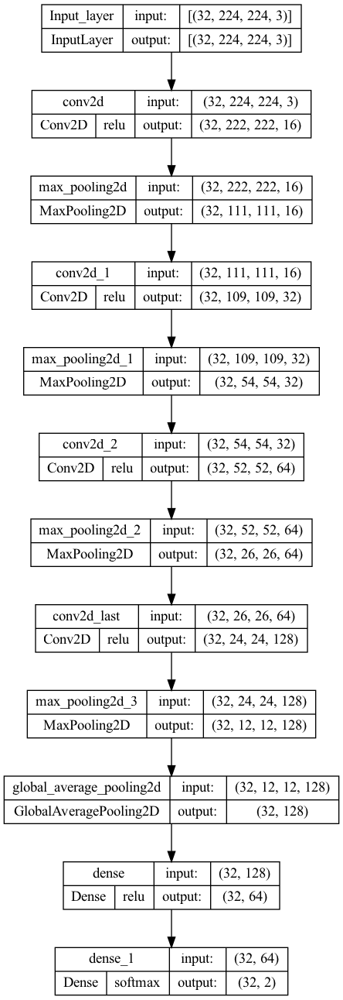

In [16]:
# %%script echo skipping

tf.random.set_seed(global_random_state)

model = CNN(m_name='model')

# Build the model

model.build(input_shape=(batch_size_val, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))


# Compile the model


# total_parameters = model.count_params()
# print(f"Total number of parameters: {total_parameters}")
# plot_model(model,to_file=f'{pathfinal2}/model.png', show_shapes=True, show_layer_activations=True, expand_nested=True)

model.compile(loss="SparseCategoricalCrossentropy",
                    optimizer="adam",
                    metrics=["accuracy"])

model.summary()

plot_model(model.build_graph(),to_file=f'model_images/model.png', show_shapes=True, show_layer_activations=True, expand_nested=True)

### Model fit

In [17]:
%%script echo "skipped"

# Evaluate the model initial losses
initial_train_loss, initial_train_acc = model.evaluate(X_train, Y_train, verbose=0)
initial_valid_loss, initial_valid_acc = model.evaluate(X_val, Y_val, verbose=0)

# Fit the model
hist = model.fit(X_train, Y_train,
                        batch_size = batch_size_val,
                        epochs=epoch,
                        validation_data=(X_val, Y_val),
                        callbacks=[model_saver, 
                                   HistorySaver((initial_train_loss, initial_train_acc, initial_valid_loss, initial_valid_acc), interval), 
                                   early_stopping_cb],
                        verbose=1)

df_history = pd.DataFrame(hist.history)

skipped


In [18]:
# %%script echo "skipped"

df_history = pd.read_csv('savedModel/C1project_interpretability_99.csv')
model.load_weights('savedModel/C1project_interpretability_99.tf')

2024-03-13 02:41:38.302937: W tensorflow/core/util/tensor_slice_reader.cc:96] Could not open savedModel/C1project_interpretability_99.tf: FAILED_PRECONDITION: savedModel/C1project_interpretability_99.tf; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?


In [19]:
class_names = ['Fake', 'Real']

def prediction(model, X, Y):
    # Predict the values from the validation dataset
    Y_pred = model.predict(X, verbose=0)
    # Convert predictions classes to one hot vectors 
    Y_pred_classes = np.argmax(Y_pred,axis = 1) 
    
    # compute the confusion matrix
    confusion_mtx = confusion_matrix(Y, Y_pred_classes) 
    # plot the confusion matrix
    plot_confusion_matrix(confusion_mtx, classes = class_names)
    accuracy = accuracy_score(Y, Y_pred_classes)
    print(f"Accuracy: {accuracy*100 : .2f} %")

def prediction_on_one_image(model, image_path):
    image = prepare_image(image_path)
    image = image.reshape(-1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2])
    y_pred = model.predict(image)
    print(y_pred)
    y_pred_class = np.argmax(y_pred, axis = 1)[0]
    print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

### Inferences

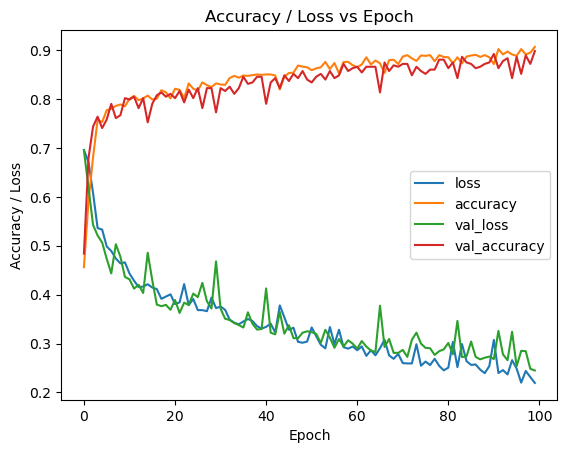

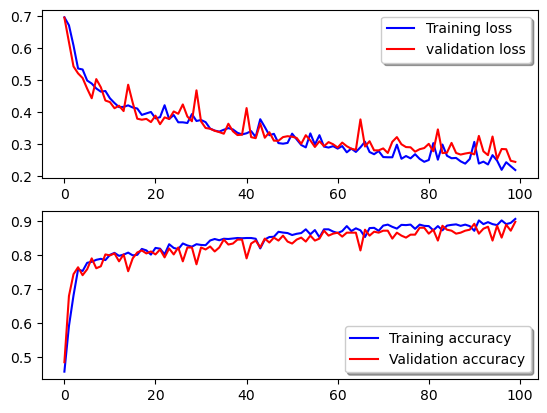

In [20]:
inferences(df_history, model)

## On Train set

2024-03-13 02:41:39.457567: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Accuracy:  91.30 %


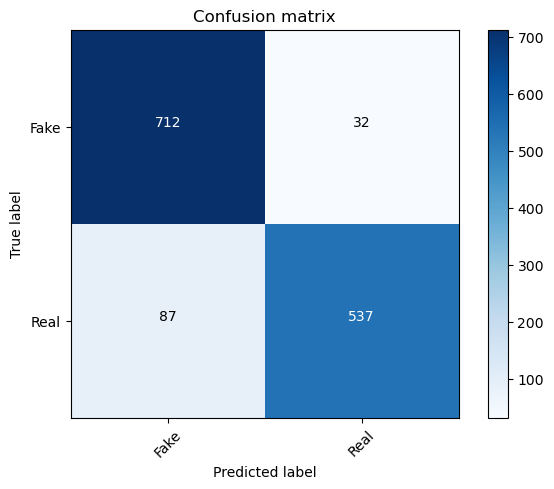

In [21]:
prediction(model, X_train, Y_train)

## On Validation set

Accuracy:  89.80 %


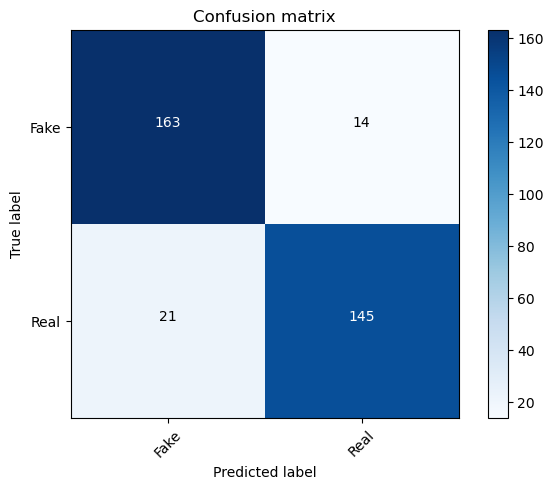

In [22]:
prediction(model, X_val, Y_val)

Prediction

In [23]:
prediction_on_one_image(model, real_image_path)
prediction_on_one_image(model, fake_image_path)

1/1 [==============================] - 0s 16ms/step
[[1.6687269e-05 9.9998331e-01]]
Class: Real Confidence: 100.00
1/1 [==============================] - 0s 34ms/step
[[0.9336108  0.06638918]]
Class: Fake Confidence: 93.36


### Analysis

In [24]:
def countA(arr, l):
    c=0
    for i in range(len(arr)):
        if(arr[i][0] == l[0] and arr[i][1] == l[1]):
            c+=1
    return c

print('TRAINING DATA')
print(f'Total Examples: {len(X_train)}')
print(f'Real Images: {np.count_nonzero(Y_train == 1)}')
print(f'Fake Images: {np.count_nonzero(Y_train == 0)} = {countA(Y_train_t, [0, 0])} same + {countA(Y_train_t, [0, 1])} different')

print()
print('VALIDATION DATA')
print(f'Total Examples: {len(X_val)}')
print(f'Real Images: {np.count_nonzero(Y_val == 1)}')
print(f'Fake Images: {np.count_nonzero(Y_val == 0)} = {countA(Y_val_t, [0, 0])} same + {countA(Y_val_t, [0, 1])} different')

TRAINING DATA
Total Examples: 1368
Real Images: 624
Fake Images: 744 = 370 same + 374 different

VALIDATION DATA
Total Examples: 343
Real Images: 166
Fake Images: 177 = 89 same + 88 different


In [25]:
X_val_real = []
Y_val_real = []

X_val_fake_same = []
Y_val_fake_same = []

X_val_fake_different = []
Y_val_fake_different = []

def data_split(X_val, Y_val_t, Y_val):
    for i in range(len(X_val)):
        if(Y_val_t[i][0] == 1): # real
            X_val_real.append(X_val[i])
            Y_val_real.append(Y_val[i])
        else:
            if(Y_val_t[i][1] == 0): # fake same
                X_val_fake_same.append(X_val[i])
                Y_val_fake_same.append(Y_val[i])
            else: # fake different
                X_val_fake_different.append(X_val[i])
                Y_val_fake_different.append(Y_val[i])

data_split(X_val, Y_val_t, Y_val)
X_val_real = np.array(X_val_real)
Y_val_real = np.array(Y_val_real)
X_val_fake_same = np.array(X_val_fake_same)
Y_val_fake_same = np.array(Y_val_fake_same)
X_val_fake_different = np.array(X_val_fake_different)
Y_val_fake_different = np.array(Y_val_fake_different)

### Real Images Validation Set

Accuracy:  87.35 %


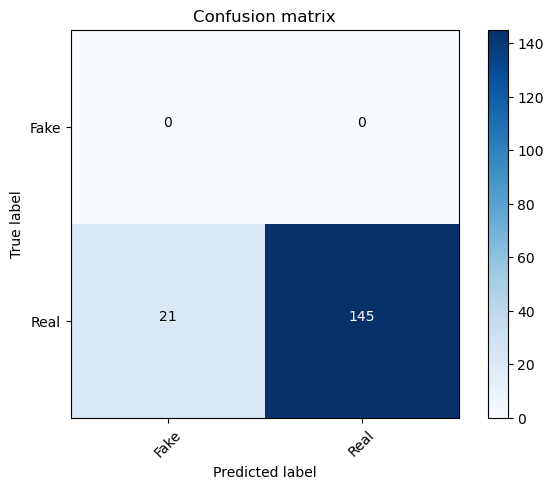

In [26]:
prediction(model, X_val_real, Y_val_real)

### Fake Images Copy-Move Validation Set

Accuracy:  91.01 %


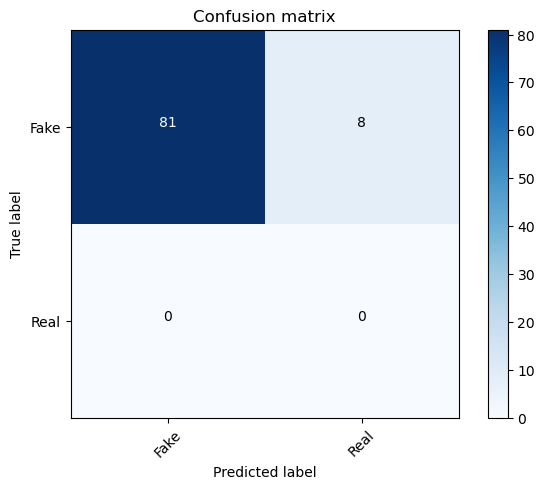

In [27]:
prediction(model, X_val_fake_same, Y_val_fake_same)

### Fake Images Splicing Validation Set

Accuracy:  93.18 %


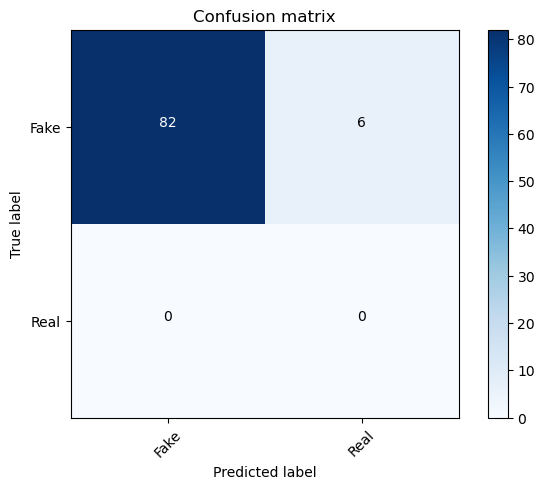

In [28]:
prediction(model, X_val_fake_different, Y_val_fake_different)

## Patches that maximally activate a neuron

In [29]:
def image_patch_with_max_val_in_last_conv_layer(model, img):
    activation_function_change(model, True, tf.keras.activations.linear)
    # Create a random input image
    input_image = tf.expand_dims(img, axis=0)

    # Compute the gradient of the first neuron in the last convolutional layer
    intermediate_output = model.intermediate_output(input_image)
    max_value = tf.math.reduce_max(intermediate_output)

    # Print the coordinates of the max value
    max_coords = tf.where(tf.equal(intermediate_output, max_value))
    # print("Coordinates of max value:", max_coords.numpy())
    _, x_c, y_c, z_c = max_coords.numpy()[0]

    # print(f'last_conv_output shape = {intermediate_output.shape}')
    gradient = get_intermediate_gradients(model, tf.squeeze(input_image), x=x_c, y=y_c, z=z_c)

    # Print the shape of the gradient
    # print(f'gradient shape = {gradient.shape}')

    tensor_var = gradient.numpy()
    # Assuming your tensor variable is named 'tensor_var'

    # Find non-zero elements of the tensor variable
    non_zero_indices = tf.where(tf.not_equal(tensor_var, 0))

    # Replace non-zero elements with 255.0 (float)
    updates = tf.ones_like(non_zero_indices[:, 0], dtype=tf.float32) * 255.0
    tensor_var = tf.tensor_scatter_nd_update(tensor_var, non_zero_indices, updates)

    # show image with patch 
    image_with_patch = tensor_var.numpy().astype("uint8")
    # plt.imshow(image_with_patch)
    # plt.show()

    image_countour = tf.squeeze(input_image).numpy().astype("uint8")

    # Convert the image to grayscale
    gray = cv2.cvtColor(image_with_patch, cv2.COLOR_BGR2GRAY)

    # Threshold the image to create a binary image
    ret, thresh = cv2.threshold(gray, 254, 255, cv2.THRESH_BINARY)

    # Find the contours of the patches with pixel value 255
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Extract the coordinates of the first contour
    contour = contours[0]
    coordinates = np.squeeze(contour)

    # Find the bounding rectangle for the contour
    x, y, w, h = cv2.boundingRect(contour)

    # for the actual boundary
    # cv2.drawContours(image_countour, [coordinates], 0, (0, 255, 0), 2)

    # Draw the rectangle on the image
    cv2.rectangle(image_countour, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Display the resulting image
    # plt.imshow(image_countour)
    # plt.axis(False)
    # plt.show()
    activation_function_change(model, False)
    return image_countour

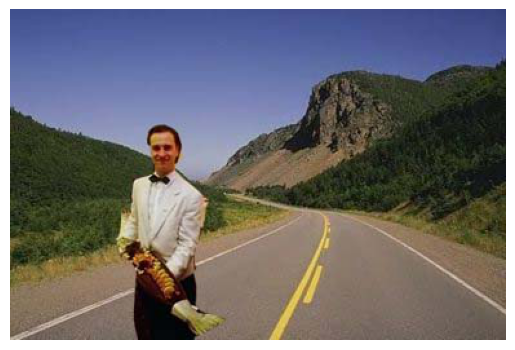

In [30]:
path_im = f'{dir}/Tp/{os.listdir(f"{dir}/Tp/")[1]}'

im = Image.open(path_im)
plt.imshow(im)
plt.axis('off')
plt.show()

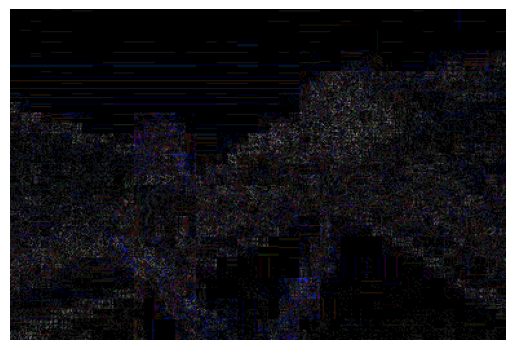

In [31]:
im2 = convert_to_ELA_image(path_im, 90)
plt.imshow(im2)
plt.axis('off')
plt.show()

In [32]:
prediction_on_one_image(model, path_im)

1/1 [==============================] - 0s 14ms/step
[[0.9364172  0.06358278]]
Class: Fake Confidence: 93.64


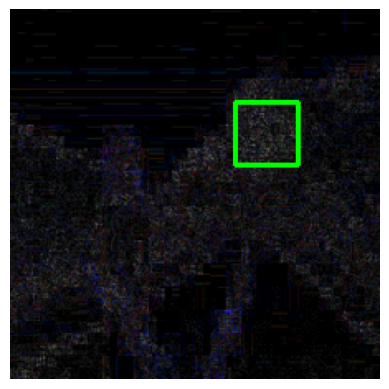

In [33]:
im3 = im2.resize((224, 224))
im3 = np.array(im3, dtype=np.float32)
img = image_patch_with_max_val_in_last_conv_layer(model, im3)
plt.imshow(img)
plt.axis('off')
plt.show()

## Grad Cam

In [34]:
def get_gradients_output_wrt_lastConv(model, image, pred_index=None):
    inputs = tf.cast(tf.expand_dims(image/255., axis=0), dtype=tf.float32)
    # inputs = tf.cast(tf.expand_dims(image, axis=0), dtype=tf.float32)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = model.intermediate_conv_and_final_output(inputs)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    return grads[0], last_conv_layer_output

def make_heatmap(image, model, pred_index=None):
      # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads, last_conv_layer_output = get_gradients_output_wrt_lastConv(model, image, pred_index)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    grads = tf.expand_dims(grads, axis=0)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


# Generate class activation heatmap
# heatmap = make_heatmap(img1/255., model_1, 0)

# # Display heatmap
# plt.matshow(heatmap)
# plt.show()


def superimpose_heatmap_and_orig_image(tf_image, heatmap, alpha=0.8):
    # image
    img = tf_image.numpy().astype("uint8")

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = matplotlib.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((IMG_SIZE[0], IMG_SIZE[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # plt.imshow(superimposed_img)
    # plt.axis(False)
    # plt.show()
    return superimposed_img

### Grad Cam on Fake Image

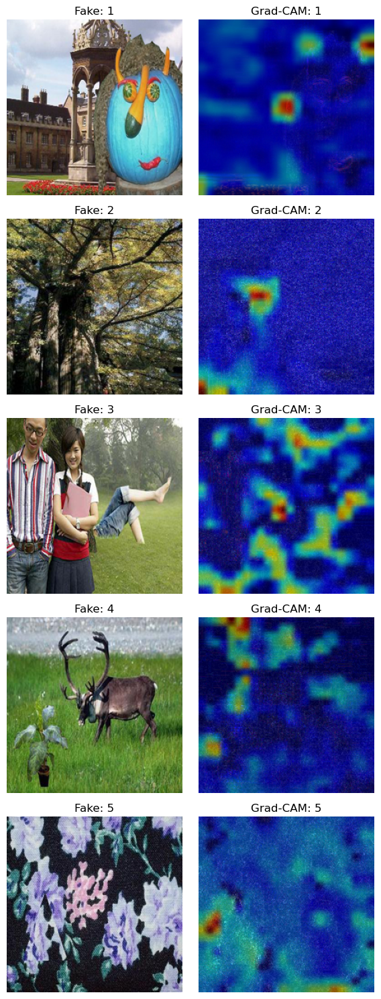

In [35]:
def plotting_gradcam_output(model):
    fig, ax = plt.subplots(5, 2, figsize=(6, 15))
    ax = ax.reshape(-1)
    c=0
    for i in range(5):
        # fake
        path_im = f'{dir}/Tp/{os.listdir(f"{dir}/Tp/")[i+10]}'
        ind = 0
        
        # real
        # path_im = f'{dir}/Au/{os.listdir(f"{dir}/Au/")[i]}'
        # ind = 1

        im = Image.open(path_im)
        im = im.resize((224, 224))
        ax[c].imshow(im)
        ax[c].axis(False)
        ax[c].set_title(f'Fake: {i+1}')
        c+=1

        im2 = convert_to_ELA_image(path_im, 90)
        im3 = im2.resize((224, 224))
        im3 = np.array(im3, dtype=np.float32)
        heatmap = make_heatmap(im3, model, ind) # 0 means fake and 1 means real
        ax[c].axis(False)
        ax[c].imshow(superimpose_heatmap_and_orig_image(tf.convert_to_tensor(im3), heatmap))
        ax[c].set_title(f'Grad-CAM: {i+1}')
        c+=1
        

    plt.tight_layout()
    plt.show()

plotting_gradcam_output(model)

## Guided Grad Cam

In [36]:
def create_Guided_GradCam_Image(model, img, index=None):
    heat_map = make_heatmap(img, model, index)
    gradCamImage = superimpose_heatmap_and_orig_image(img, heat_map)

    # resize
    heat_map = np.expand_dims(heat_map, axis=2)
    cam3 = tf.image.resize(heat_map, (IMG_SIZE[0], IMG_SIZE[1]))
    # coppy first dimension appropriately
    cam3 = np.tile(cam3, [1,1,3])

    activation_function_change(model, True, GbpRelu)
    gpb_gradient = get_intermediate_gradients(model, img, ':', ':', ':')
    activation_function_change(model, False)
    
    # dot operation
    guided_gradCamImage = deprocess_image(cam3 * gpb_gradient)
    return guided_gradCamImage, gradCamImage

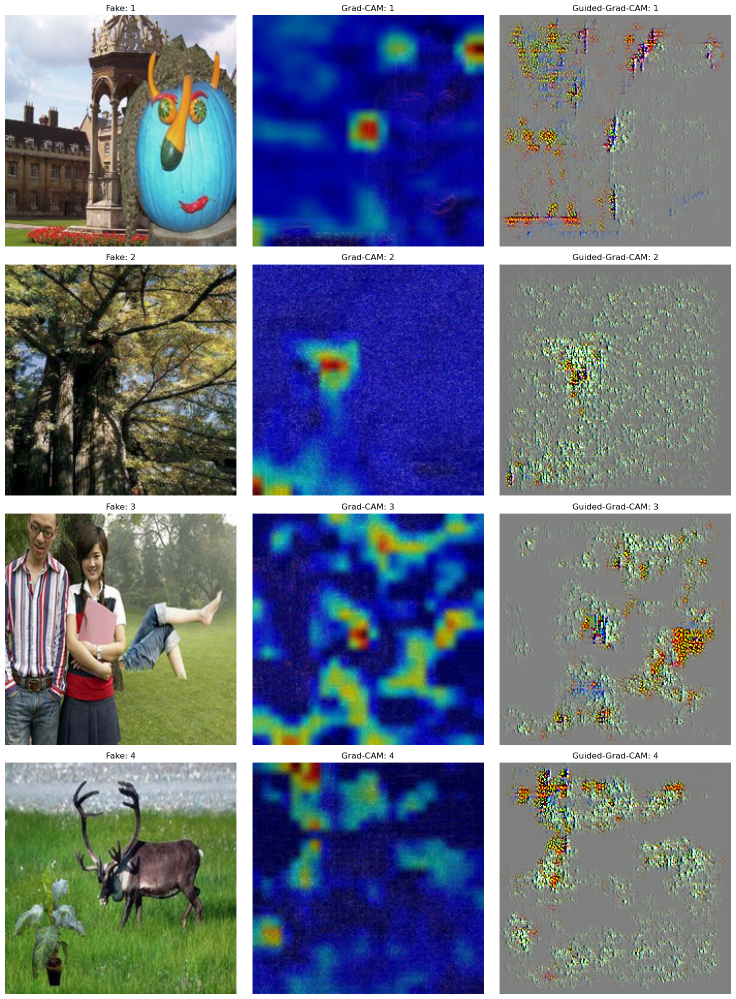

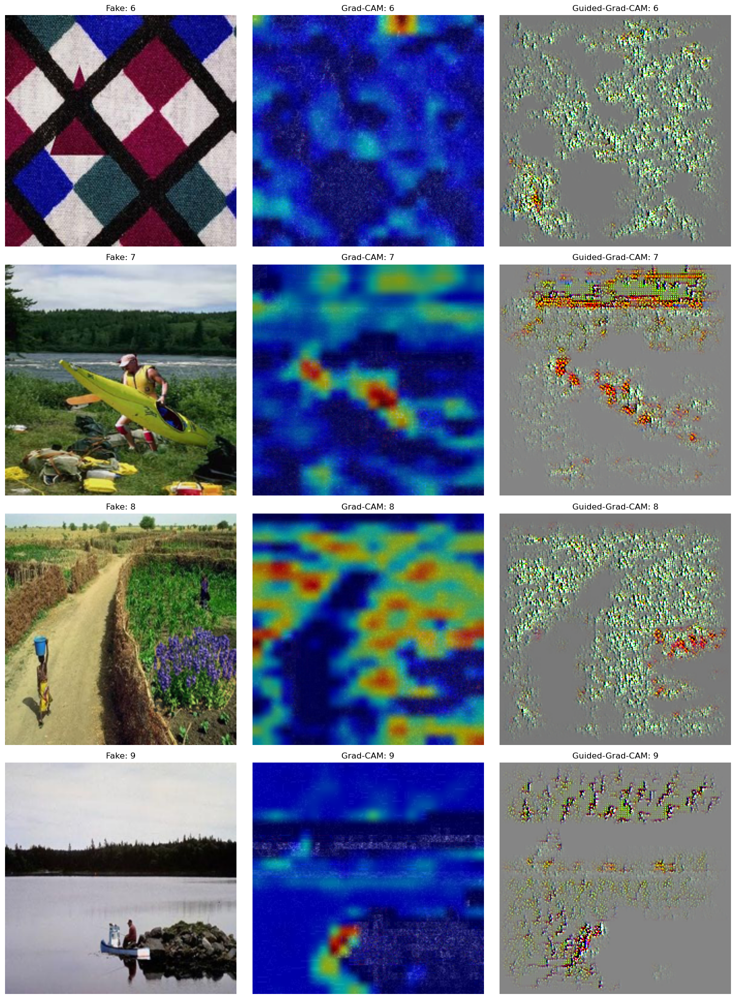

In [42]:
def plotting_gradcam_output(model):
    fig, ax = plt.subplots(4, 3, figsize=(15, 20))
    ax = ax.reshape(-1)
    c=0
    for i in range(4):
        # fake
        path_im = f'{dir}/Tp/{os.listdir(f"{dir}/Tp/")[i+10]}'
        ind = 0
        
        # real
        # path_im = f'{dir}/Au/{os.listdir(f"{dir}/Au/")[i]}'
        # ind = 1

        im = Image.open(path_im)
        im = im.resize((224, 224))
        ax[c].imshow(im)
        ax[c].axis(False)
        ax[c].set_title(f'Fake: {i+1}')
        c+=1

        im2 = convert_to_ELA_image(path_im, 90)
        im3 = im2.resize((224, 224))
        im3 = np.array(im3, dtype=np.float32)
        tf_image = tf.convert_to_tensor(im3)
        guided_gradCamImage, gradCamImage = create_Guided_GradCam_Image(model, tf_image, ind)
        ax[c].imshow(gradCamImage)
        ax[c].axis(False)
        ax[c].set_title(f'Grad-CAM: {i+1}')
        c+=1

        ax[c].imshow(guided_gradCamImage)
        ax[c].axis(False)
        ax[c].set_title(f'Guided-Grad-CAM: {i+1}')
        c+=1

    plt.tight_layout()
    plt.show()


    fig, ax = plt.subplots(4, 3, figsize=(15, 20))
    ax = ax.reshape(-1)
    c=0
    for i in range(5, 9):
        # fake
        path_im = f'{dir}/Tp/{os.listdir(f"{dir}/Tp/")[i+10]}'
        ind = 0
        
        # real
        # path_im = f'{dir}/Au/{os.listdir(f"{dir}/Au/")[i]}'
        # ind = 1

        im = Image.open(path_im)
        im = im.resize((224, 224))
        ax[c].imshow(im)
        ax[c].axis(False)
        ax[c].set_title(f'Fake: {i+1}')
        c+=1

        im2 = convert_to_ELA_image(path_im, 90)
        im3 = im2.resize((224, 224))
        im3 = np.array(im3, dtype=np.float32)
        tf_image = tf.convert_to_tensor(im3)
        guided_gradCamImage, gradCamImage = create_Guided_GradCam_Image(model, tf_image, ind)
        ax[c].imshow(gradCamImage)
        ax[c].axis(False)
        ax[c].set_title(f'Grad-CAM: {i+1}')
        c+=1

        ax[c].imshow(guided_gradCamImage)
        ax[c].axis(False)
        ax[c].set_title(f'Guided-Grad-CAM: {i+1}')
        c+=1

    plt.tight_layout()
    plt.show()

plotting_gradcam_output(model)